In [19]:
import librosa
import numpy as np
from IPython.display import Audio

In [10]:
y, sr = librosa.load("test.wav", sr=44100)
Audio(y, rate=sr)

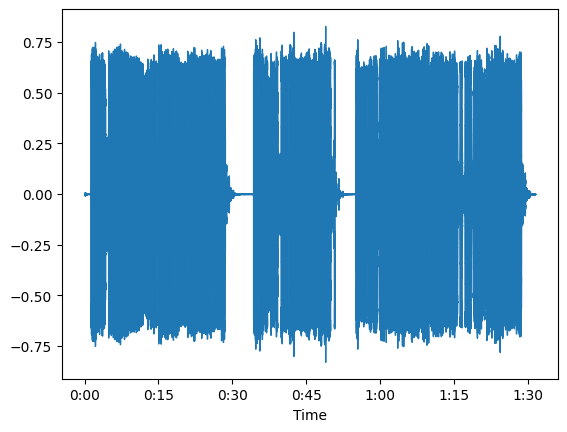

In [11]:
librosa.display.waveshow(y=y, sr=sr)

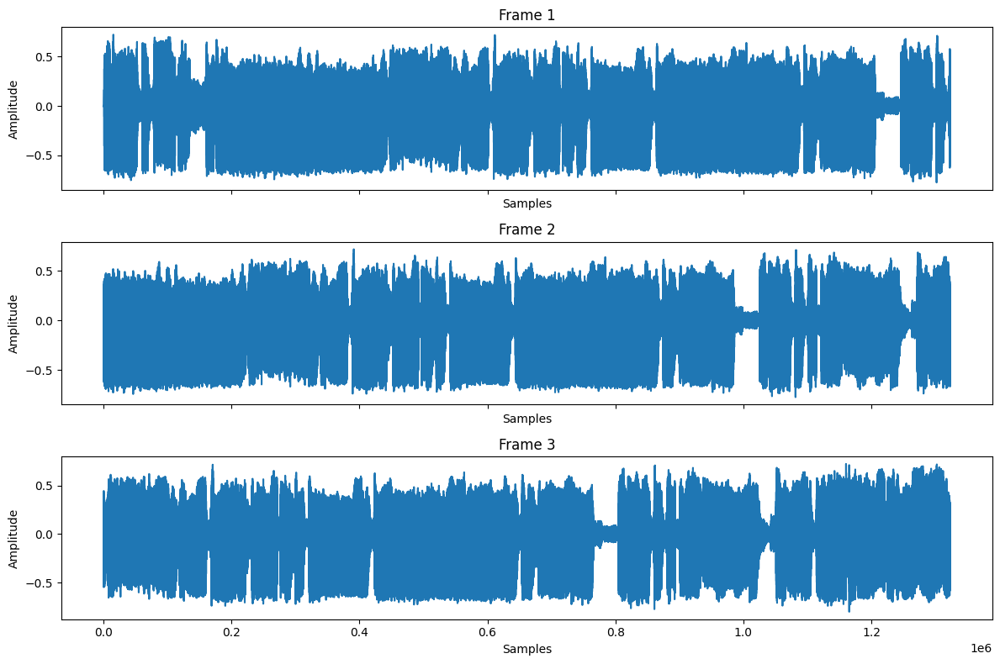

In [43]:
y_trimmed, _ = librosa.effects.trim(y=y, top_db=30)
non_silent_intervals = librosa.effects.split(y_trimmed, top_db=30)
y_no_silent = np.concatenate([y_trimmed[start:end] for start, end in non_silent_intervals])
y_framed = librosa.util.frame(y_no_silent, frame_length=30 * 44100, hop_length=5 * 44100)

fig, ax = plt.subplots(3, 1, figsize=(12, 8), sharex=True)
for i in range(3):
    ax[i].plot(y_framed[:, i])
    ax[i].set_title(f'Frame {i+1}')
    ax[i].set_xlabel('Samples')
    ax[i].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

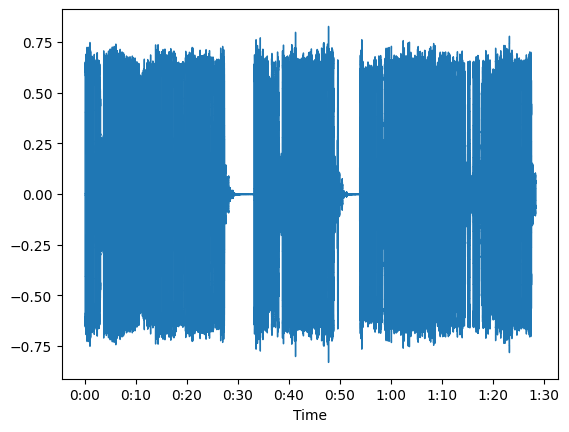

In [15]:
librosa.display.waveshow(y=y_trimmed, sr=sr)

In [28]:

Audio(y_no_silent, rate=sr)

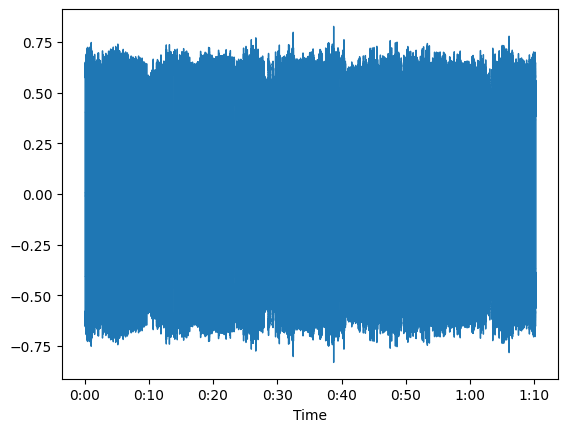

In [29]:
librosa.display.waveshow(y=y_no_silent, sr=sr)